<h1 align="center">Face Detection</h1>
<h4 align="center">By Sharoon Yaqub</h4>

In [3]:
import cv2

In [70]:
image = cv2.imread('1.png')
image

array([[[ 91, 103, 107],
        [102, 114, 118],
        [ 92, 107, 110],
        ...,
        [187, 192, 193],
        [186, 191, 192],
        [185, 190, 191]],

       [[ 93, 105, 109],
        [ 97, 109, 113],
        [ 95, 110, 113],
        ...,
        [187, 192, 193],
        [186, 191, 192],
        [185, 190, 191]],

       [[ 96, 111, 114],
        [ 96, 111, 114],
        [102, 117, 120],
        ...,
        [186, 191, 192],
        [185, 190, 191],
        [184, 189, 190]],

       ...,

       [[ 48,  43,  40],
        [ 46,  41,  38],
        [ 44,  39,  36],
        ...,
        [251, 248, 244],
        [252, 247, 244],
        [251, 246, 243]],

       [[ 55,  49,  44],
        [ 53,  47,  42],
        [ 49,  43,  38],
        ...,
        [251, 248, 244],
        [252, 247, 244],
        [252, 247, 244]],

       [[ 56,  50,  45],
        [ 54,  48,  43],
        [ 50,  44,  39],
        ...,
        [252, 249, 245],
        [253, 248, 245],
        [253, 248, 245]]

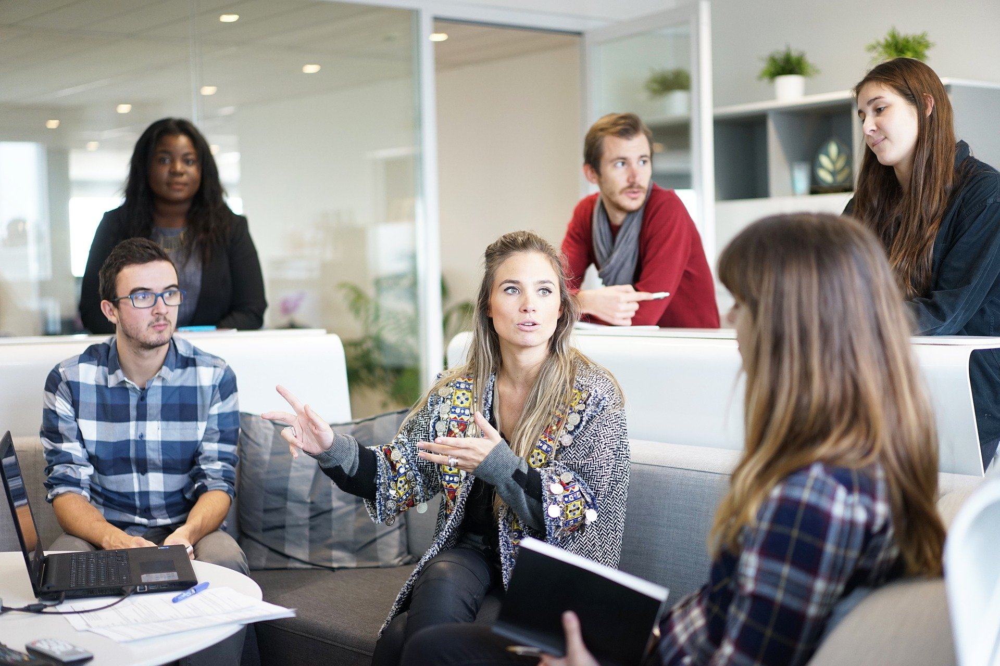

In [71]:
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [16]:
image.shape

(1280, 1920, 3)

In [43]:
face_detector = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')
eye_detector = cv2.CascadeClassifier('/content/haarcascade_eye.xml')

In [67]:
detector_face = face_detector.detectMultiScale(image, scaleFactor=1.1, minNeighbors=6)
detector_eye = eye_detector.detectMultiScale(image, scaleFactor=1.1, minNeighbors=10, maxSize=(100, 100))

In [20]:
detector_face

array([[1639,  159,  141,  141],
       [ 284,  263,  113,  113],
       [1148,  261,  129,  129],
       [ 229,  509,  142,  142],
       [ 928,  488,  172,  172],
       [ 103,  784,   56,   56],
       [  44,  919,   30,   30]], dtype=int32)

In [21]:
len(detector_face)

7

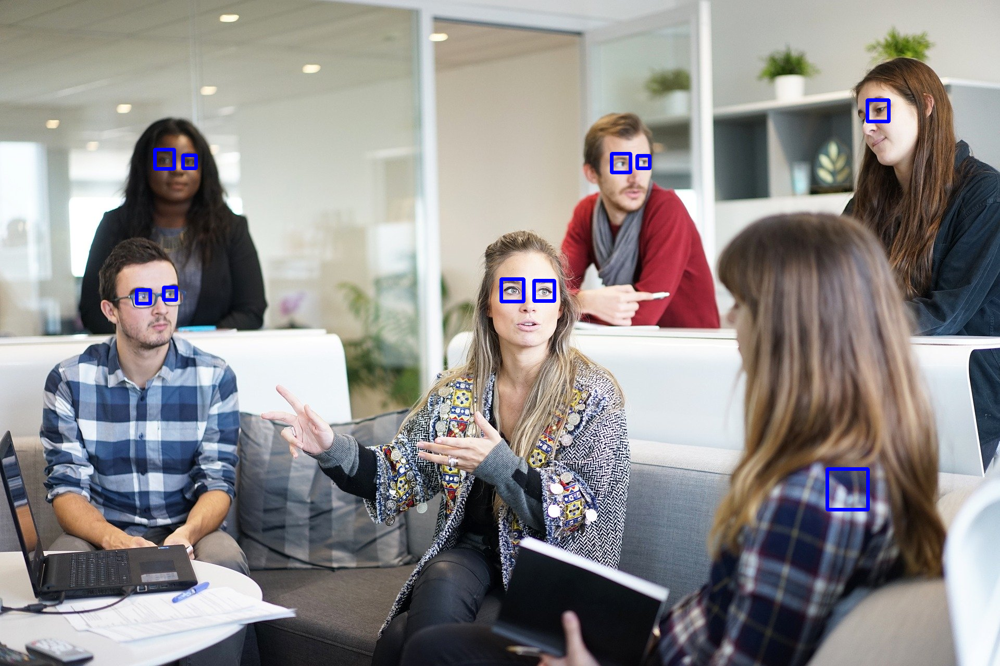

In [72]:
for (x , y, w, h) in detector_eye:
  cv2.rectangle(image, (x, y), (x + w, y + h), (255,0,0), 5)
cv2_imshow(image)


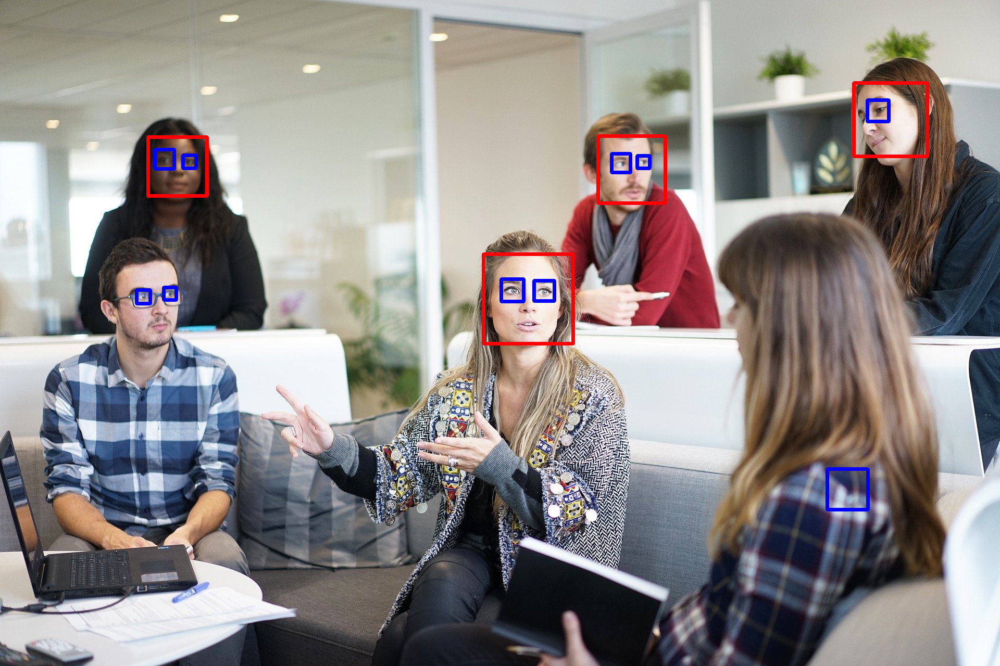

In [73]:
for (x , y, w, h) in detector_face:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,0,255), 5)
cv2_imshow(image)


#### Cars

In [77]:
image = cv2.imread('2.png')

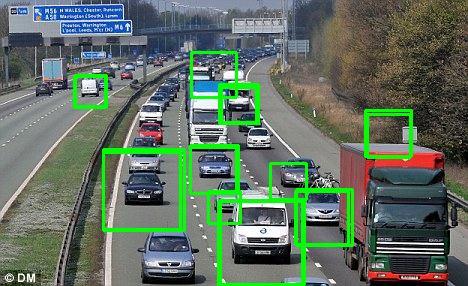

In [78]:
car_detector = cv2.CascadeClassifier('/content/cars.xml')

image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = car_detector.detectMultiScale(image_gray, scaleFactor = 1.03, minNeighbors=5, maxSize=(300,300))
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

#### Clocks

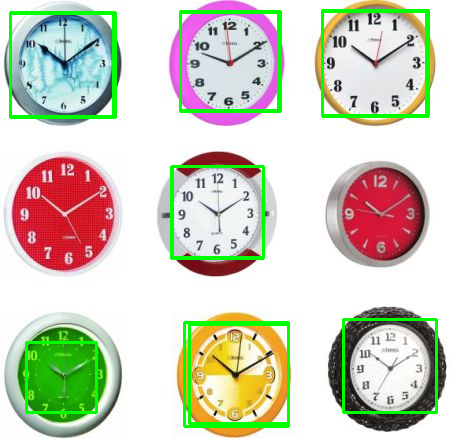

In [79]:
clock_detector = cv2.CascadeClassifier('/content/clocks.xml')
image = cv2.imread('/content/download.png')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = clock_detector.detectMultiScale(image_gray, scaleFactor = 1.03, minNeighbors=1)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

#### Full body

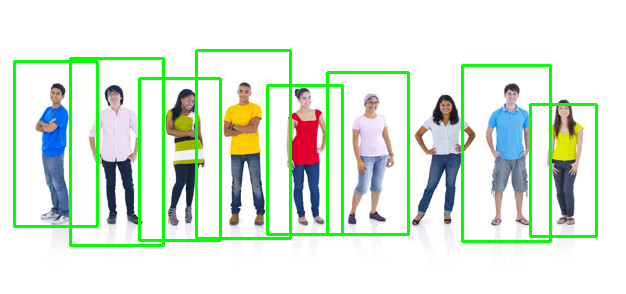

In [ ]:
full_detector = cv2.CascadeClassifier('fullbody.xml')
image = cv2.imread('people3.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = full_detector.detectMultiScale(image_gray, scaleFactor = 1.05, minNeighbors=5,
                                              minSize = (50,50))
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

In [ ]:
import dlib

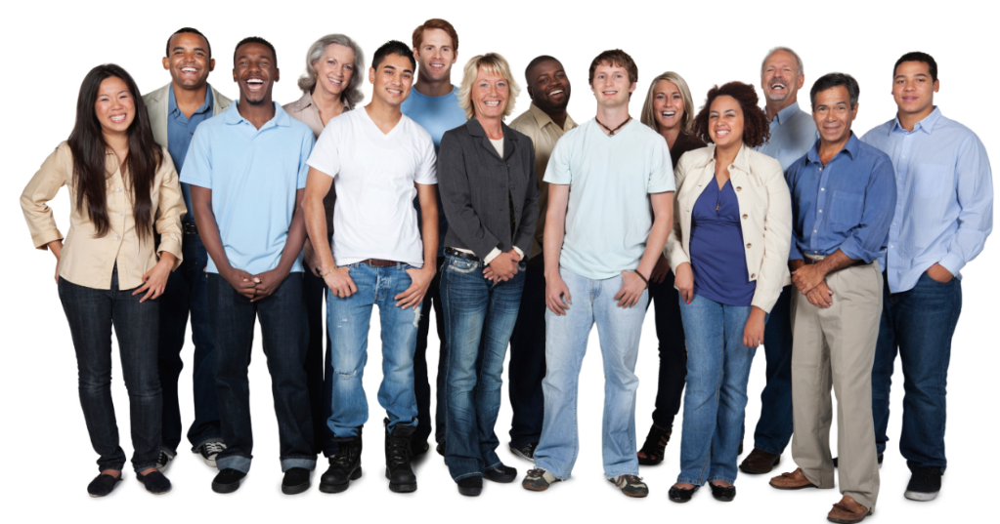

In [ ]:
image = cv2.imread('Images/people2.jpg')
cv2_imshow(image)

In [ ]:
face_detector_hog = dlib.get_frontal_face_detector()

In [ ]:
detections = face_detector_hog(image, 1)

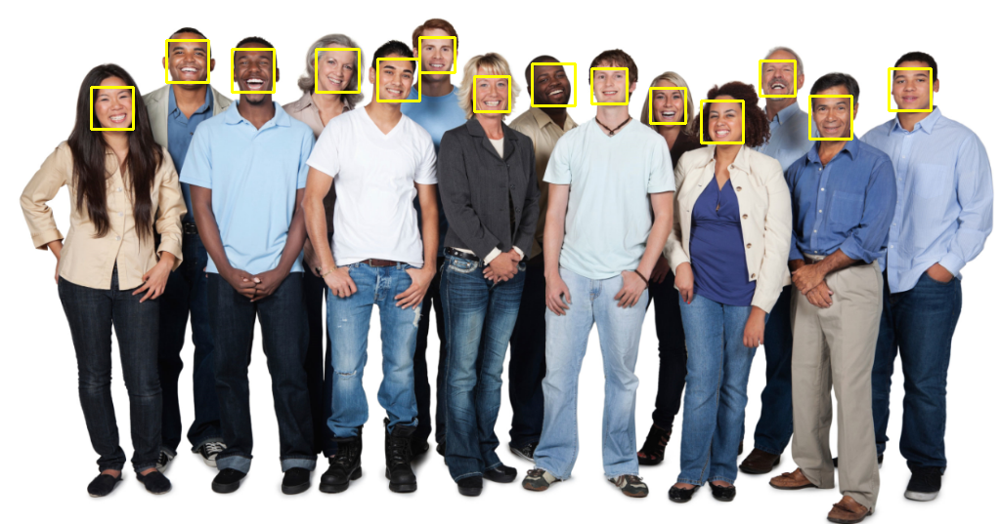

In [ ]:
for face in detections:
  #print(face)
  #print(face.left())
  #print(face.top())
  #print(face.right())
  #print(face.bottom())
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l, t), (r, b), (0, 255, 255), 2)
cv2_imshow(image)

### Detecting faces with CNN (Convolutional Neural Networks)

In [ ]:
image = cv2.imread('people2.jpg')
cnn_detector = dlib.cnn_face_detection_model_v1('/mmod_human_face_detector.dat')

1.1440614461898804
1.137049913406372
1.1278995275497437
1.1200283765792847
1.1149375438690186
1.1131553649902344
1.0975688695907593
1.0942121744155884
1.085315227508545
1.0801889896392822
1.0800762176513672
1.0784764289855957
1.066403865814209
1.0641791820526123


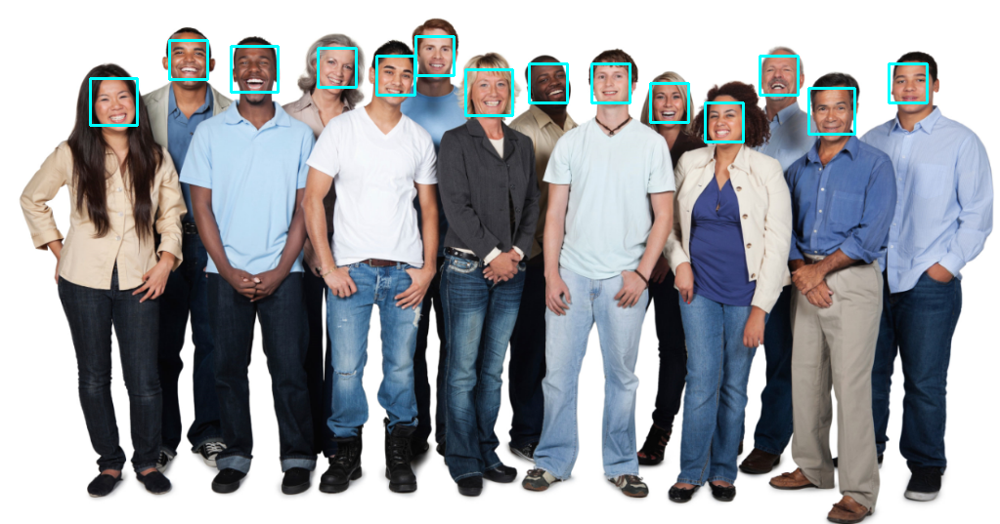

In [ ]:
detections = cnn_detector(image, 1)
for face in detections:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  print(c)
  cv2.rectangle(image, (l, t), (r, b), (255, 255, 0), 2)
cv2_imshow(image)

In [ ]:
image.shape

(294, 626, 3)

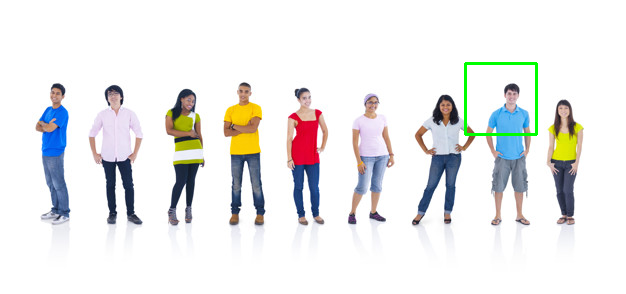

In [ ]:
image = cv2.imread('Images/people3.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
haarcascade_detector = cv2.CascadeClassifier('Cascades/haarcascade_frontalface_default.xml')
detections = haarcascade_detector.detectMultiScale(image_gray, scaleFactor = 1.001, minNeighbors=5, minSize = (5,5))
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

#### HOG

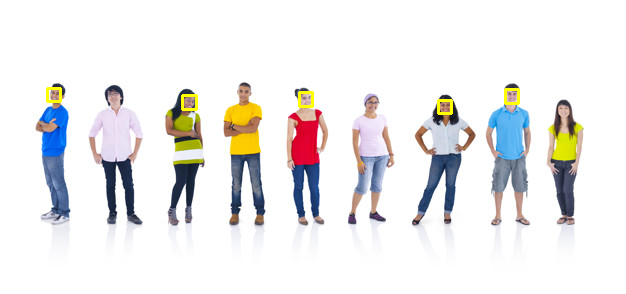

In [ ]:
image = cv2.imread('/Images/people3.jpg')
face_detector_hog = dlib.get_frontal_face_detector()
detections = face_detector_hog(image, 4)
for face in detections:
    l, t, r, b = (face.left(), face.top(), face.right(), face.bottom())
    cv2.rectangle(image, (l, t), (r, b), (0, 255, 255), 2)
cv2_imshow(image)

#### CNN

0.4463871121406555
0.08115974068641663


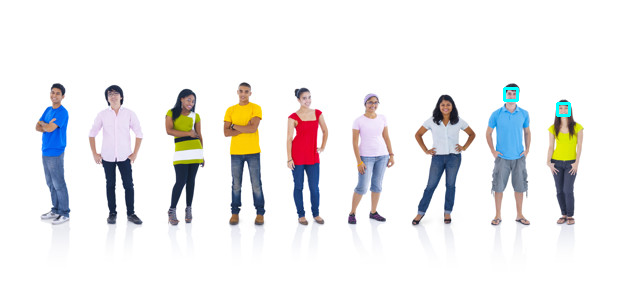

In [ ]:
image = cv2.imread('/content/download.png')
cnn_detector = dlib.cnn_face_detection_model_v1('Weights/mmod_human_face_detector.dat')
detections = cnn_detector(image, 4)
for face in detections:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  print(c)
  cv2.rectangle(image, (l, t), (r, b), (255, 255, 0), 2)
cv2_imshow(image)